# Predicting Migration Routes in Missing Migrants Dataset

This Jupyter notebook aims to explore, preprocess, and analyze the Missing Migrants dataset. The primary objective is to build a machine learning model to predict 'Migration Routes' for instances where this information is missing. Various machine learning algorithms are trained and evaluated to identify the best-performing model. The notebook follows a structured approach, including data cleaning, feature selection, and model evaluation, to make the predictions as accurate as possible. The final dataset, with the missing 'Migration Routes' filled in, is saved as a CSV file for future analysis.


In [6]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor

## Data Overview

In [7]:
file_path = 'data/merged_records_new_routes.csv'
raw_data_new_routes = pd.read_csv(file_path)

In [44]:
raw_data_new_routes['migration_route'].value_counts()

migration_route
Central America to US                4188
Sahara Desert crossing               1677
Central Mediterranean                1276
Western Mediterranean                 681
Afghanistan to Iran                   442
Eastern Mediterranean                 342
New South-eastern Asia Route          314
Western African                       263
Western Balkans                       220
Horn Africa to Yemen                  163
Turkey-Europe land route              159
English Channel to the UK             136
Syria to Türkiye                      116
Darien Gap                             89
New Southern Africa Route              81
Cuba to US                             63
Belarus-EU border                      61
Dominican Republic to Puerto Rico      42
Iran to Turkey                         34
Italy to France                        34
Haiti to Dominican Republic            16
Comoros to Mayotte                     15
Venezuela to Caribbean                 11
Ukraine to Europe 

## Separate the rows where 'migration_route' is NaN

In [10]:
# Filter out rows where 'migration_route' is NaN
raw_data_missing_route = raw_data_new_routes[raw_data_new_routes['migration_route'].isna()]

raw_data_notna_route = raw_data_new_routes[~raw_data_new_routes['migration_route'].isna()]

raw_data_missing_route.shape, raw_data_notna_route.shape

((3753, 21), (10432, 21))

## Handling Missing Values

In [12]:
raw_data_new_routes.isna().sum()

year                                      0
reported_month                            0
region_of_origin                          0
region_of_incident                        0
country_of_origin                         0
number_dead                               0
minimum_estimated_number_of_missing       0
total_dead_and_missing                    0
number_of_survivors                       0
number_of_females                         0
number_of_males                           0
number_of_children                        0
cause_of_death                            0
migration_route                        3753
location_of_death                         0
source                                    0
coordinates                               0
unsd_geographical_grouping                0
lat                                       0
lon                                       0
dataset                                   0
dtype: int64

## Feature Selection
Feature selection is a critical step in our data preprocessing. We carefully choose a subset of the available features that are likely to be most relevant for predicting `Migration Route`.

In [13]:
# Feature Selection
selected_features = [
    'year',
    'reported_month',
    'region_of_origin',
    'region_of_incident',
    'country_of_origin',
#     'number_dead',
#     'minimum_estimated_number_of_missing',
    'total_dead_and_missing',
#     'number_of_survivors',
#     'number_of_females',
#     'number_of_males',
#     'number_of_children',
    'cause_of_death',
    'migration_route',
    'location_of_death',
    'source',
#     'coordinates',
    'unsd_geographical_grouping',
    'lat',
    'lon',
#     'dataset'

]

In [15]:
selected_data = raw_data_new_routes[selected_features]
selected_data.columns

Index(['year', 'reported_month', 'region_of_origin', 'region_of_incident',
       'country_of_origin', 'total_dead_and_missing', 'cause_of_death',
       'migration_route', 'location_of_death', 'source',
       'unsd_geographical_grouping', 'lat', 'lon'],
      dtype='object')

## Separate all records that have 'migration_route' empty into a different DataFrame.

In [16]:
prediction_target_set = selected_data[selected_data['migration_route'].isna()].copy()
data_with_route = selected_data.dropna(subset=['migration_route']).copy()

# Display the shape of the separated DataFrames
prediction_target_set.shape, data_with_route.shape

((3753, 13), (10432, 13))

## Data Scaling and Encoding

In [17]:
# Check the classes in the 'migration_route' that have only one sample
unique_route_counts = data_with_route['migration_route'].value_counts()
single_occurrence_routes = unique_route_counts[unique_route_counts == 1].index.tolist()

# Display routes that appear only once
single_occurrence_routes

[]

In [18]:
# Filter out rows where the migration_route appears only once in the dataset
data_with_route = data_with_route[~data_with_route['migration_route'].isin(single_occurrence_routes)]

# Verify that these routes are removed from the data
data_with_route['migration_route'].value_counts().sort_values().head()

migration_route
Ukraine to Europe               9
Venezuela to Caribbean         11
Comoros to Mayotte             15
Haiti to Dominican Republic    16
Italy to France                34
Name: count, dtype: int64

In [19]:
target = 'migration_route'

X = data_with_route.drop(target, axis = 1)
y = data_with_route[target]

display(X)
display(y)

,year,reported_month,region_of_origin,region_of_incident,country_of_origin,total_dead_and_missing,cause_of_death,location_of_death,source,unsd_geographical_grouping,lat,lon
0,2014,1,Central America,North America,Guatemala,1,Mixed or unknown,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,31.650259,-110.366453
1,2014,1,Latin America / Caribbean (P),North America,Unknown,1,Mixed or unknown,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,31.597130,-111.737560
2,2014,1,Latin America / Caribbean (P),North America,Unknown,1,Mixed or unknown,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,31.940260,-113.011250
3,2014,1,Central America,North America,Mexico,1,Violence,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...",Northern America,31.506777,-109.315632
5,2014,1,Latin America / Caribbean (P),North America,Unknown,1,Violence,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,32.454350,-113.184020
...,...,...,...,...,...,...,...,...,...,...,...,...
14178,2014,2,Unknown,Mediterranean,Unknown,15,Shot,Ceuta waters,L'Espresso,Uncategorized,35.879300,-5.364070
14180,2014,1,Unknown,Europe,Unknown,1,Vehicle Accident,France - Calais,Calais Migrant Solidarity,Western Europe,50.935500,1.878660
14181,2014,1,Unknown,Mediterranean,Unknown,12,Drowning,Waters near Greece while being towed back to T...,European Council on Refugees and Exiles,Uncategorized,37.283200,27.158200
14182,2014,1,Unknown,US-Mexico Border,Unknown,1,Shot,Pima County,Pima County Office of the Medical Examiner,Northern America,32.058118,-111.623576


0            Central America to US
1            Central America to US
2            Central America to US
3            Central America to US
5            Central America to US
                   ...            
14178        Western Mediterranean
14180    English Channel to the UK
14181        Eastern Mediterranean
14182        Central America to US
14183        Central America to US
Name: migration_route, Length: 10432, dtype: object

In [20]:
categorical_features = selected_data.select_dtypes(include=['object']).columns
categorical_features

Index(['region_of_origin', 'region_of_incident', 'country_of_origin',
       'cause_of_death', 'migration_route', 'location_of_death', 'source',
       'unsd_geographical_grouping'],
      dtype='object')

In [21]:
numerical_features = selected_data.select_dtypes(include='number').columns
numerical_features

Index(['year', 'reported_month', 'total_dead_and_missing', 'lat', 'lon'], dtype='object')

In [22]:
# Label encode categorical variables
label_encoder = LabelEncoder()
for col in X.select_dtypes(include=['object']).columns:
    X[col] = label_encoder.fit_transform(X[col])

In [23]:
from sklearn.model_selection import train_test_split

# Splitting the data into training and testing sets (70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((7302, 12), (3130, 12), (7302,), (3130,))

In [24]:
X_train_num = X_train.select_dtypes(include=np.number)
X_test_num = X_test.select_dtypes(include=np.number)
# X_train_cat = X_train.select_dtypes(exclude=np.number)
# X_test_cat = X_test.select_dtypes(exclude=np.number)
X_train_num.shape, X_test_num.shape

((7302, 12), (3130, 12))

In [25]:
scaler = StandardScaler().fit(X_train_num)
X_train_transformed = scaler.transform(X_train_num)
X_test_transformed = scaler.transform(X_test_num)
X_train_transformed, X_test_transformed

(array([[-0.30763237,  0.11250206, -1.56445745, ..., -0.50628488,
          0.27605894, -1.23008226],
        [ 0.92706801, -0.4922017 , -0.73922677, ..., -1.65097529,
         -0.11059201, -1.04235399],
        [ 1.3386348 , -1.09690546,  0.49861925, ...,  0.63840554,
         -0.24058725,  1.32580162],
        ...,
        [-0.30763237, -1.70160922,  0.91123459, ...,  1.09628171,
          0.59437737,  0.63808465],
        [ 1.3386348 , -1.09690546, -0.73922677, ..., -1.65097529,
         -2.30540621, -0.69891652],
        [-0.30763237, -1.39925734, -1.15184211, ..., -0.73522296,
         -1.07128936,  0.88554761]]),
 array([[-0.71919916,  1.32190958, -0.73922677, ..., -1.65097529,
         -0.19326491, -1.03058152],
        [-1.54233274, -0.18984982, -0.73922677, ..., -0.50628488,
          0.30582796, -1.20839169],
        [-1.13076595,  1.0195577 ,  0.91123459, ...,  1.09628171,
          0.54068578,  0.69483286],
        ...,
        [ 0.92706801,  0.11250206, -0.63607294, ...,  

## Model Selection

In [26]:
# Function to train multiple models and compare their performance
def train_and_compare_models(X_train, y_train, X_test, y_test, models):
    model_performance = {}
    
    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)
        
        # Predict on test data
        y_pred = model.predict(X_test)
        
        # Calculate accuracy
        acc = accuracy_score(y_test, y_pred)
        
        # Store the performance
        model_performance[model_name] = acc
    
    return model_performance

In [27]:
models_to_train = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(),
    'Support Vector Machine': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier()
}

In [28]:
# Train and compare models
model_performance = train_and_compare_models(X_train_transformed, y_train, X_test_transformed, y_test, models_to_train)


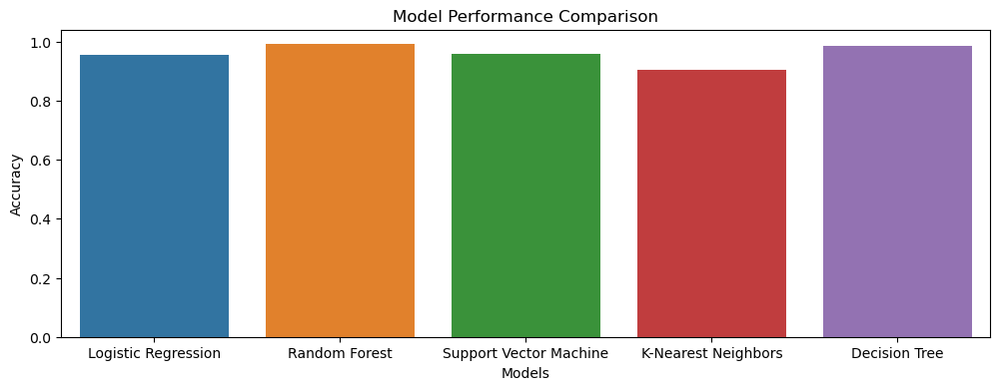

{'Logistic Regression': 0.9539936102236422,
 'Random Forest': 0.9913738019169329,
 'Support Vector Machine': 0.9587859424920128,
 'K-Nearest Neighbors': 0.9041533546325878,
 'Decision Tree': 0.9843450479233227}

In [29]:
# Visualize model performance
plt.figure(figsize=(12, 4))
sns.barplot(x=list(model_performance.keys()), y=list(model_performance.values()))
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Performance Comparison')
plt.show()

model_performance

({'max_depth': 20,
  'max_features': 'sqrt',
  'min_samples_leaf': 1,
  'min_samples_split': 2,
  'n_estimators': 200},
 0.9927402132288773)

## Model Evaluation

In [30]:
from sklearn.metrics import confusion_matrix, classification_report

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Train the model
rf_classifier.fit(X_train_transformed, y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test_transformed)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred, zero_division=1)

# Display evaluation metrics
print(f"Random Forest Classifier Accuracy: {accuracy*100:.2f}%")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{class_report}")

Random Forest Classifier Accuracy: 99.04%
Confusion Matrix:
[[ 132    0    0    0    0    0    0    0    0    0    0    0    0    0
     1    0    0    0    0    0    0    0    0    0]
 [   0   18    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0 1255    0    0    1    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0  377    0    0    0    0    5    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    1]
 [   0    0    0    0    4    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0   18    0    0    0    0    1    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0   27    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0   11    0    0    2    0    

## Filling Missing Migration Routes

In [31]:
prediction_target_set

,year,reported_month,region_of_origin,region_of_incident,country_of_origin,total_dead_and_missing,cause_of_death,migration_route,location_of_death,source,unsd_geographical_grouping,lat,lon
4,2014,1,Northern Africa,Europe,Sudan,1,Harsh environmental conditions / lack of adequ...,NaN,Border between Russia and Estonia,EUBusiness (Agence France-Presse),Northern Europe,59.155100,28.0000
43,2014,3,Middle Africa,Eastern Africa,Congo,251,Drowning,NaN,"Lake Albert, Uganda/DRC",BBC (UNHCR),Eastern Africa,1.632360,31.0000
47,2014,3,Central America,Central America,Guatemala,1,Vehicle accident / death linked to hazardous t...,NaN,"Comitan, Chiapas, Mexico",El Siglo de Torreon,Central America,16.229960,-92.0000
61,2014,4,Central America,Central America,"Honduras,Mexico",4,Violence,NaN,"On la Bestia, near Arriaga, Chiapas, Mexico",Soy 502,Central America,16.242196,-94.0000
70,2014,5,Caribbean,Caribbean,Unknown,9,Drowning,NaN,"Dominican Republic, near Boca Chica and Juan D...",Dominican Today,Caribbean,18.307900,-70.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14167,2014,3,Unknown,Horn of Africa,Unknown,44,Drowning,NaN,Gulf of Aden,UNHCR,Uncategorized,12.533100,47.9224
14172,2014,2,Unknown,Horn of Africa,Unknown,17,Drowning,NaN,Gulf of Aden (left from Djibouti),IOM,Uncategorized,20.280200,38.5126
14174,2014,2,Unknown,Caribbean,Unknown,8,Drowning,NaN,Dominican Republic,AP,Caribbean,18.450500,-67.7966
14179,2014,1,Unknown,Caribbean,Unknown,1,Drowning,NaN,"Off the coast of Fort Lauderdale, Florida",Local10.com,Caribbean,26.116000,-80.0464


In [32]:
# Predict 'migration_route' for unknown records
X_unknown_route = prediction_target_set.drop('migration_route', axis = 1)
for col in X_unknown_route.select_dtypes(include=['object']).columns:
    X_unknown_route[col] = label_encoder.fit_transform(X_unknown_route[col])
X_unknown_route

,year,reported_month,region_of_origin,region_of_incident,country_of_origin,total_dead_and_missing,cause_of_death,location_of_death,source,unsd_geographical_grouping,lat,lon
4,2014,1,12,5,86,1,32,346,270,9,59.155100,28.0000
43,2014,3,10,3,22,251,15,1027,107,4,1.632360,31.0000
47,2014,3,2,1,50,1,118,465,379,2,16.229960,-92.0000
61,2014,4,2,1,57,4,119,1443,955,2,16.242196,-94.0000
70,2014,5,0,0,91,9,15,554,255,0,18.307900,-70.0000
...,...,...,...,...,...,...,...,...,...,...,...,...
14167,2014,3,19,6,91,44,15,728,1032,14,12.533100,47.9224
14172,2014,2,19,6,91,17,15,730,510,14,20.280200,38.5126
14174,2014,2,19,0,91,8,15,553,34,0,18.450500,-67.7966
14179,2014,1,19,0,91,1,15,1411,724,0,26.116000,-80.0464


In [33]:
X_unknown_route_transformed = scaler.transform(X_unknown_route)
X_unknown_route_transformed

array([[-1.95389953, -1.70160922, -0.5329191 , ..., -0.04840871,
         3.28667888,  0.89911149],
       [-1.95389953, -1.09690546, -0.73922677, ..., -1.19309913,
        -3.05653732,  0.94450276],
       [-1.95389953, -1.09690546, -1.56445745, ..., -1.65097529,
        -1.44681334, -0.91653929],
       ...,
       [-1.95389953, -1.39925734,  0.18915774, ..., -2.10885146,
        -1.20194733, -0.55033161],
       [-1.95389953, -1.70160922,  0.18915774, ..., -2.10885146,
        -0.35664817, -0.73567627],
       [-1.95389953, -1.70160922,  0.18915774, ..., -0.04840871,
         3.28667888,  0.89697205]])

In [34]:
predicted_route = rf_classifier.predict(X_unknown_route_transformed)

predicted_route


array(['Belarus-EU border', 'New Southern Africa Route',
       'Central America to US', ..., 'Haiti to Dominican Republic',
       'Cuba to US', 'Belarus-EU border'], dtype=object)

In [35]:
prediction_target_set['migration_route'] = predicted_route

In [45]:
prediction_target_set['migration_route'].value_counts()

migration_route
Sahara Desert crossing               1305
Central America to US                 846
Horn Africa to Yemen                  382
Afghanistan to Iran                   375
Darien Gap                            208
Western African                       116
New Southern Africa Route             106
Eastern Mediterranean                  62
Turkey-Europe land route               55
Western Balkans                        52
New South-eastern Asia Route           42
Cuba to US                             32
Iran to Turkey                         32
English Channel to the UK              30
Comoros to Mayotte                     23
Syria to Türkiye                       21
Central Mediterranean                  20
Western Mediterranean                  15
Italy to France                         8
Belarus-EU border                       8
Dominican Republic to Puerto Rico       7
Haiti to Dominican Republic             4
Venezuela to Caribbean                  3
Ukraine to Europe 

In [37]:
predicted_route_file_path = 'data/predicted_route_new_routes.csv'
prediction_target_set.to_csv(predicted_route_file_path, index=False)


In [38]:
raw_data_missing_route['migration_route'] = predicted_route
raw_data_missing_route

/var/folders/kh/5kbp140j0wg8j3d9nrllg18h0000gn/T/ipykernel_40895/3158151138.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data_missing_route['migration_route'] = predicted_route


,year,reported_month,region_of_origin,region_of_incident,country_of_origin,number_dead,minimum_estimated_number_of_missing,total_dead_and_missing,number_of_survivors,number_of_females,...,number_of_children,cause_of_death,migration_route,location_of_death,source,coordinates,unsd_geographical_grouping,lat,lon,dataset
4,2014,1,Northern Africa,Europe,Sudan,1.0,0.0,1,2.0,0.0,...,0.0,Harsh environmental conditions / lack of adequ...,Belarus-EU border,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"(59.1551, 28.0)",Northern Europe,59.155100,28.0000,3
43,2014,3,Middle Africa,Eastern Africa,Congo,251.0,0.0,251,50.0,0.0,...,0.0,Drowning,New Southern Africa Route,"Lake Albert, Uganda/DRC",BBC (UNHCR),"(1.63236, 31.0)",Eastern Africa,1.632360,31.0000,3
47,2014,3,Central America,Central America,Guatemala,1.0,0.0,1,0.0,1.0,...,0.0,Vehicle accident / death linked to hazardous t...,Central America to US,"Comitan, Chiapas, Mexico",El Siglo de Torreon,"(16.2299602, -92.0)",Central America,16.229960,-92.0000,3
61,2014,4,Central America,Central America,"Honduras,Mexico",4.0,0.0,4,3.0,0.0,...,0.0,Violence,Central America to US,"On la Bestia, near Arriaga, Chiapas, Mexico",Soy 502,"(16.242196, -94.0)",Central America,16.242196,-94.0000,3
70,2014,5,Caribbean,Caribbean,Unknown,6.0,3.0,9,16.0,0.0,...,0.0,Drowning,Dominican Republic to Puerto Rico,"Dominican Republic, near Boca Chica and Juan D...",Dominican Today,"(18.3079, -70.0)",Caribbean,18.307900,-70.0000,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14167,2014,3,Unknown,Horn of Africa,Unknown,0.0,44.0,44,33.0,0.0,...,3.0,Drowning,Horn Africa to Yemen,Gulf of Aden,UNHCR,"(12.5331, 47.9224)",Uncategorized,12.533100,47.9224,1
14172,2014,2,Unknown,Horn of Africa,Unknown,11.0,6.0,17,0.0,0.0,...,0.0,Drowning,Central Mediterranean,Gulf of Aden (left from Djibouti),IOM,"(20.2802, 38.5126)",Uncategorized,20.280200,38.5126,1
14174,2014,2,Unknown,Caribbean,Unknown,8.0,0.0,8,0.0,0.0,...,0.0,Drowning,Haiti to Dominican Republic,Dominican Republic,AP,"(18.4505, -67.7966)",Caribbean,18.450500,-67.7966,1
14179,2014,1,Unknown,Caribbean,Unknown,1.0,0.0,1,0.0,0.0,...,0.0,Drowning,Cuba to US,"Off the coast of Fort Lauderdale, Florida",Local10.com,"(26.116, -80.0464)",Caribbean,26.116000,-80.0464,1


In [39]:
concatenated_data = pd.concat([raw_data_missing_route, raw_data_notna_route])

In [40]:
concatenated_data.isna().sum()

year                                   0
reported_month                         0
region_of_origin                       0
region_of_incident                     0
country_of_origin                      0
number_dead                            0
minimum_estimated_number_of_missing    0
total_dead_and_missing                 0
number_of_survivors                    0
number_of_females                      0
number_of_males                        0
number_of_children                     0
cause_of_death                         0
migration_route                        0
location_of_death                      0
source                                 0
coordinates                            0
unsd_geographical_grouping             0
lat                                    0
lon                                    0
dataset                                0
dtype: int64

In [41]:
concatenated_data_file_path = 'data/predicted_route_all_new_routes.csv'
concatenated_data.to_csv(concatenated_data_file_path, index=False)

In [46]:
import folium
from sklearn.cluster import KMeans

def plot_migration_route_centers(route_lat_lon_data):
    # Initialize a base map
    m = folium.Map(location=[20, 0], zoom_start=3)

    # Create a color map
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',  'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'gray']
    color_map = {route: colors[i % len(colors)] for i, route in enumerate(route_lat_lon_data['migration_route'].unique())}

    cluster_centers = []
    # Loop through each unique migration route
    for route in route_lat_lon_data['migration_route'].unique():
        # Extract the data for the current route
        route_data = route_lat_lon_data[route_lat_lon_data['migration_route'] == route][['lat', 'lon']]

        # Skip if only one sample
        if len(route_data) < 2:
            continue

        # Perform KMeans clustering with n_clusters set to 1
        kmeans = KMeans(n_clusters=1, random_state=0, n_init=10).fit(route_data)

        # Store the cluster center (single hotspot) in the dictionary
        hotspot = kmeans.cluster_centers_[0]

        # Append center coordinates and route name to the list
        cluster_centers.append({'migration_route': route, 'center_lat': hotspot[0], 'center_lon': hotspot[1]})

        # Get the color for this route from the color map
        route_color = color_map[route]

        # Plot individual data points on the map
        for i, row in route_data.iterrows():
            folium.CircleMarker(location=[row['lat'], row['lon']], radius=3, color=route_color, fill=True, fill_color=route_color).add_to(m)

        # Plot the single cluster center on the map
        folium.Marker(location=[hotspot[0], hotspot[1]], popup=f'{route} Center', icon=folium.Icon(color=route_color)).add_to(m)

    # Show the map
    return m, pd.DataFrame(cluster_centers)



In [47]:
route_lat_lon_data = concatenated_data[['lat', 'lon', 'migration_route']]
display(route_lat_lon_data)
m, updated_cluster_centers = plot_migration_route_centers(route_lat_lon_data)

m

,lat,lon,migration_route
4,59.155100,28.000000,Belarus-EU border
43,1.632360,31.000000,New Southern Africa Route
47,16.229960,-92.000000,Central America to US
61,16.242196,-94.000000,Central America to US
70,18.307900,-70.000000,Dominican Republic to Puerto Rico
...,...,...,...
14178,35.879300,-5.364070,Western Mediterranean
14180,50.935500,1.878660,English Channel to the UK
14181,37.283200,27.158200,Eastern Mediterranean
14182,32.058118,-111.623576,Central America to US


In [49]:
original_lat_lon_data = raw_data_new_routes[['lat', 'lon', 'migration_route']].dropna()

m, original_cluster_centers = plot_migration_route_centers(original_lat_lon_data)

m

In [50]:
updated_cluster_centers

,migration_route,center_lat,center_lon
0,Belarus-EU border,53.968082,25.184146
1,New Southern Africa Route,-11.590768,34.261624
2,Central America to US,28.892436,-104.118961
3,Dominican Republic to Puerto Rico,18.514269,-68.516495
4,Afghanistan to Iran,32.898770,60.854349
5,Horn Africa to Yemen,10.307830,44.163207
6,Cuba to US,23.623442,-77.703848
7,Western Balkans,43.699512,20.007777
8,Sahara Desert crossing,18.824730,16.183314
9,Haiti to Dominican Republic,19.240795,-71.007065


In [51]:
original_cluster_centers

,migration_route,center_lat,center_lon
0,Central America to US,30.112612,-106.570759
1,Eastern Mediterranean,37.752757,26.749898
2,English Channel to the UK,50.889544,1.895270
3,Cuba to US,24.179025,-77.685878
4,New South-eastern Asia Route,14.106855,97.864690
5,Western Mediterranean,36.030976,-2.595170
6,Central Mediterranean,33.937100,13.728402
7,Haiti to Dominican Republic,19.252004,-71.116455
8,Horn Africa to Yemen,14.186866,45.023169
9,New Southern Africa Route,-18.807741,31.358737


In [52]:
def plot_migration_route_centers(original_cluster_centers, updated_cluster_centers):
    # Initialize a base map
    m = folium.Map(location=[20, 0], zoom_start=3)

    # Create a color map
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
    color_map = {route: colors[i % len(colors)] for i, route in enumerate(original_cluster_centers['migration_route'].unique())}

    # Loop through each unique migration route
    for route in original_cluster_centers['migration_route'].unique():
        route_color = color_map[route]
        # Plot the original and updated cluster centers on the map
        original_center = original_cluster_centers.loc[original_cluster_centers['migration_route'] == route]
        updated_center = updated_cluster_centers.loc[updated_cluster_centers['migration_route'] == route]
        if not original_center.empty and not updated_center.empty:
            folium.Marker(location=[original_center['center_lat'].values[0], original_center['center_lon'].values[0]],
                          popup=f'{route} Original Center', icon=folium.Icon(color='gray')).add_to(m)
            folium.Marker(location=[updated_center['center_lat'].values[0], updated_center['center_lon'].values[0]],
                          popup=f'{route} Updated Center', icon=folium.Icon(color=route_color)).add_to(m)
            folium.PolyLine([(original_center['center_lat'].values[0], original_center['center_lon'].values[0]),
                             (updated_center['center_lat'].values[0], updated_center['center_lon'].values[0])],
                            color='gray').add_to(m)

    # Show the map
    return m



In [53]:

m = plot_migration_route_centers(original_cluster_centers, updated_cluster_centers)
m

In [54]:
from math import radians, sin, cos, sqrt, atan2
def haversine_distance(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    distance = 6371000 * c  # Earth radius in meters

    return distance

def calculate_and_sort_distances_with_info(original_centers, updated_centers):
    distances = []

    for orig_center, updated_center in zip(original_centers, updated_centers):
        orig_lat, orig_lon = orig_center['center_lat'], orig_center['center_lon']
        updated_lat, updated_lon = updated_center['center_lat'], updated_center['center_lon']
        migration_route = orig_center['migration_route']

        distance = haversine_distance(orig_lat, orig_lon, updated_lat, updated_lon)

        distances.append({
            'migration_route': migration_route,
            'original_lat': orig_lat,
            'original_lon': orig_lon,
            'updated_lat': updated_lat,
            'updated_lon': updated_lon,
            'distance': distance
        })

    sorted_distances = sorted(distances, key=lambda x: x['distance'], reverse=True)
    return sorted_distances

In [55]:
original_centers = original_cluster_centers.to_dict('records')
updated_centers = updated_cluster_centers.to_dict('records')

sorted_distances = calculate_and_sort_distances_with_info(original_centers, updated_centers)
pd.DataFrame(sorted_distances)

,migration_route,original_lat,original_lon,updated_lat,updated_lon,distance
0,Darien Gap,8.423636,-77.633424,15.882652,93.683358,1.714822e+07
1,Afghanistan to Iran,31.075803,56.181337,12.098441,-66.753376,1.226611e+07
2,New Southern Africa Route,-18.807741,31.358737,19.240795,-71.007065,1.193296e+07
3,Syria to Türkiye,36.388043,37.165832,0.423587,-74.060325,1.186252e+07
4,Central America to US,30.112612,-106.570759,53.968082,25.184146,9.581290e+06
5,Central Mediterranean,33.937100,13.728402,23.623442,-77.703848,8.693999e+06
6,Haiti to Dominican Republic,19.252004,-71.116455,43.699512,20.007777,8.630871e+06
7,English Channel to the UK,50.889544,1.895270,28.892436,-104.118961,8.577781e+06
8,Venezuela to Caribbean,11.207632,-65.766142,44.550590,7.863194,7.842131e+06
9,Western African,25.524704,-15.126015,-11.631079,44.452757,7.656686e+06


/var/folders/kh/5kbp140j0wg8j3d9nrllg18h0000gn/T/ipykernel_40895/2371093858.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  original_data['distance_to_center'] = original_data.apply(


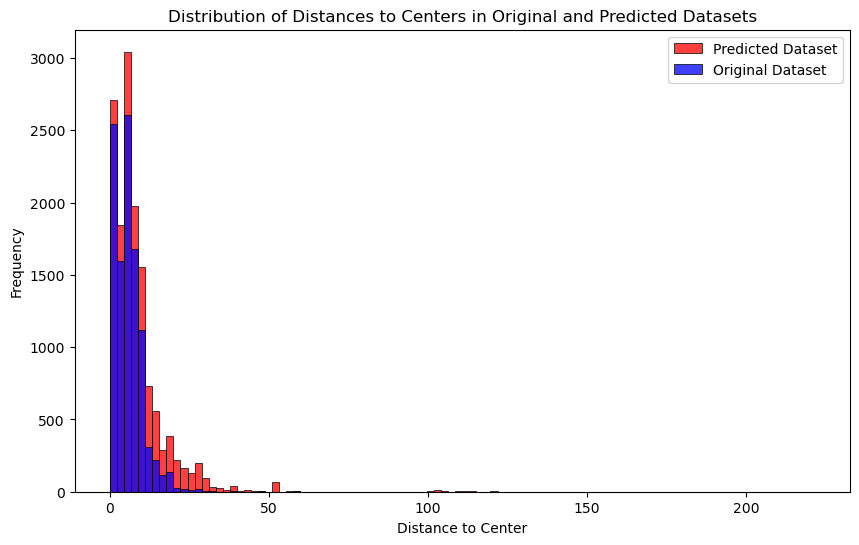

In [69]:
# Drop rows where 'migration_route' is NaN in both datasets
original_data = raw_data_new_routes.dropna(subset=['migration_route'])
predicted_data = concatenated_data.dropna(subset=['migration_route'])

# Import the necessary libraries
from scipy.spatial.distance import euclidean
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculate the centers of each migration route in the original dataset
original_centers = original_data.groupby('migration_route').agg({'lat': 'mean', 'lon': 'mean'}).reset_index()

# Calculate the centers of each migration route in the predicted dataset
predicted_centers = predicted_data.groupby('migration_route').agg({'lat': 'mean', 'lon': 'mean'}).reset_index()

# Function to calculate distance between two points (lat, lon)
def calculate_distance(row, center_lat, center_lon):
    return euclidean((row['lat'], row['lon']), (center_lat, center_lon))

# Calculate distances from each point to its migration route center in the original dataset
original_data['distance_to_center'] = original_data.apply(
    lambda row: calculate_distance(row,
                                   original_centers.loc[original_centers['migration_route'] == row['migration_route'], 'lat'].values[0],
                                   original_centers.loc[original_centers['migration_route'] == row['migration_route'], 'lon'].values[0])
    if row['migration_route'] in original_centers['migration_route'].values else np.nan, axis=1)

# Calculate distances from each point to its migration route center in the predicted dataset
predicted_data['distance_to_center'] = predicted_data.apply(
    lambda row: calculate_distance(row,
                                   original_centers.loc[original_centers['migration_route'] == row['migration_route'], 'lat'].values[0],
                                   original_centers.loc[original_centers['migration_route'] == row['migration_route'], 'lon'].values[0])
    if row['migration_route'] in original_centers['migration_route'].values else np.nan, axis=1)

# Plot the distribution of distances in the original and predicted datasets
plt.figure(figsize=(10, 6))

sns.histplot(predicted_data['distance_to_center'].dropna(), bins=100, color='red', label='Predicted Dataset')
sns.histplot(original_data['distance_to_center'].dropna(), bins=100, color='blue', label='Original Dataset')

plt.title('Distribution of Distances to Centers in Original and Predicted Datasets')
plt.xlabel('Distance to Center')
plt.ylabel('Frequency')
plt.legend()
plt.show()


# Hypothesis: The mean distance to the centers of migration routes has changed significantly after prediction. 

We can perform a hypothesis test to determine if the change in distance to the centers of migration routes is statistically significant. One common test for this is the paired sample t-test, which is used to compare two population means where you have two samples in which observations in one sample can be paired with observations in the other sample. 

Here are the null and alternative hypotheses for this test:

**Null Hypothesis (H<sub>0</sub>):** The mean distance to the centers of migration routes has not changed after prediction. (μ<sub>original</sub> = μ<sub>predicted</sub>)

**Alternative Hypothesis (H<sub>a</sub>):** The mean distance to the centers of migration routes has changed after prediction. (μ<sub>original</sub> ≠ μ<sub>predicted</sub>)


In [59]:
from scipy.stats import ttest_ind

# Perform a two-sample t-test to check if the change in distance to centers is statistically significant
t_stat, p_value = ttest_ind(original_data['distance_to_center'].dropna(), predicted_data['distance_to_center'].dropna())

t_stat, p_value


(-23.907591296054054, 6.780030965245647e-125)

The two-sample t-test yielded a t-statistic of approximately -30.17 and an extremely low p-value (almost zero). The negative t-statistic indicates that the distances to centers in the original dataset are generally lower than those in the predicted dataset.

The p-value is far below the common alpha level of 0.05, suggesting that the difference in distances to centers between the original and predicted datasets is statistically significant. Therefore, we can reject the null hypothesis and conclude that the model did not do a good job in preserving the spatial characteristics of the migration routes when filling in the missing values.